In [1]:
import os, sys

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# modelica interface
import buildingspy.simulate.Simulator as si
import buildingspy.io.outputfile as buipy_io

# thermal
import  CoolProp.CoolProp as CP
from CoolProp.HumidAirProp import HAPropsSI
import psychrolib as psylib
psylib.SetUnitSystem(psylib.SI)

In [2]:
sys.path.insert(0, os.path.join('../..', 'calibration'))
from thermodynamics import *

import media_model_mgcl2 as model_mg
import media_model_water as model_w

In [3]:
from plotting import *

In [4]:
# only reload the function imported by "aimport"
%load_ext autoreload
%autoreload 1
%aimport thermodynamics
%aimport plotting

# Functions for conversion

# get dempav data

## dempav 2021 new

In [5]:
path_expdata = os.path.join(os.path.expanduser('~'), 'GIT', 'EnBA_M', 'BrineGrid_HDisNet', 'Extras', 'Python', 'exp_data')

In [6]:
df_dempav_new = pd.read_csv(os.path.join(path_expdata, 'data_2021', '0_expdata_mean_new_ALL.csv'), sep='\t')

In [7]:
df_dempav_new.shape

(117, 16)

In [8]:
# air humidity ratio
df_dempav_new['x_a_in'] = np.vectorize(get_x)(df_dempav_new['T_a_in'], df_dempav_new['RH_a_in']/100)

df_dempav_new['x_a_o_exp'] = np.vectorize(get_x)(df_dempav_new['T_a_o_exp'], df_dempav_new['RH_a_o_exp']/100)

In [9]:
# air inlet mass flow (dry air)
df_dempav_new['m_a_in'] = np.vectorize(get_rho_dry)(df_dempav_new['T_a_in'], df_dempav_new['RH_a_in']/100)*df_dempav_new['V_a_in']

In [10]:
# desiccant inlet concentration
df_dempav_new['xi_d_in'] = np.vectorize(model_mg.xi_MgCl2)(df_dempav_new['T_a_in'], df_dempav_new['rho_d_in'])

In [11]:
# desiccant inlet mass flow
# initial unit of measured V_d_in is L/min
df_dempav_new['m_d_in'] = df_dempav_new['rho_d_in'] * df_dempav_new['V_d_in']/1000/60

In [12]:
df_dempav_new.shape

(117, 16)

In [13]:
df_dempav_new.describe()

,T_a_in,RH_a_in,x_a_in,V_a_in,m_a_in,T_d_in,rho_d_in,xi_d_in,V_d_in,m_d_in,T_a_o_exp,RH_a_o_exp,x_a_o_exp,T_d_o_exp,rho_d_o_exp,xi_d_o_exp
count,117.000000,117.000000,117.000000,117.000000,117.000000,117.000000,1.170000e+02,117.000000,117.000000,117.000000,117.000000,117.000000,117.000000,0.0,0.0,0.0
mean,296.137071,45.494981,0.007953,0.012375,0.014636,300.641717,1.296900e+03,0.318394,0.852564,0.018428,297.005412,43.825252,0.008168,NaN,NaN,NaN
std,2.754365,7.840853,0.001329,0.006016,0.007154,6.640024,3.758727e-13,0.000185,1.830699,0.039571,3.326862,7.289301,0.001901,NaN,NaN,NaN
min,289.841435,31.580000,0.005818,0.000000,0.000000,288.884282,1.296900e+03,0.318202,0.000000,0.000000,289.829987,30.590000,0.005392,NaN,NaN,NaN
25%,294.618888,38.960003,0.006819,0.012158,0.014241,293.742743,1.296900e+03,0.318270,0.000000,0.000000,295.059998,38.400002,0.006778,NaN,NaN,NaN
50%,295.894283,42.410000,0.007660,0.014678,0.017174,301.197495,1.296900e+03,0.318333,0.000000,0.000000,296.500000,42.360001,0.007482,NaN,NaN,NaN
75%,297.299988,53.070000,0.009005,0.016209,0.019139,306.701305,1.296900e+03,0.318427,0.000000,0.000000,299.229980,50.809998,0.009140,NaN,NaN,NaN
max,302.834984,59.940001,0.010924,0.019677,0.023726,313.155448,1.296900e+03,0.319017,4.750000,0.102671,304.109985,57.908002,0.013235,NaN,NaN,NaN


In [100]:
#df_dempav_new.to_excel('dempav2021.xlsx')

## dempav 2019

In [15]:
df_dempav_old = pd.read_excel(os.path.join(path_expdata, 'actual_data', 'dempav', 'dempav_T_des_corrected.xlsx'), index_col=0)

In [16]:
df_dempav_old['RH_a_in'] = df_dempav_old['hr_air_in'] * 100
df_dempav_old['RH_a_o_exp'] = df_dempav_old['hr_air_out'] * 100

In [17]:
df_dempav_old.drop(columns=['hr_air_in', 'hr_air_out'],inplace = True)

In [18]:
df_dempav_old.query('T_a_in - T_a_o_exp > 2').shape

(17, 11)

[0.18785985 0.11530983 0.12970328 0.6       ]
[0.81761636 0.64825361 0.58211304 0.6       ]
[0.75277018 0.02313031 0.73030137 0.6       ]
[0.18910288 0.20430819 0.81307006 0.6       ]
[0.12443342 0.73030061 0.09923615 0.6       ]
[0.26248297 0.56450131 0.52784411 0.6       ]
[0.58647081 0.50361485 0.17211044 0.6       ]
[0.97220968 0.80166621 0.26393947 0.6       ]
[0.83233401 0.5526813  0.84904236 0.6       ]
[0.01272678 0.88484986 0.78159417 0.6       ]
[0.38513158 0.93161563 0.98861035 0.6       ]
[0.52265356 0.99104642 0.69754009 0.6       ]
[0.59925213 0.29709066 0.63089434 0.6       ]
[0.13042873 0.48345698 0.98436413 0.6       ]
[0.28522466 0.94243153 0.38246598 0.6       ]
[0.49436053 0.02636407 0.60417188 0.6       ]
[0.90798246 0.91436036 0.5819121  0.6       ]
[0.5673554  0.16588267 0.02977449 0.6       ]
[0.05086819 0.99949887 0.1200602  0.6       ]
[0.53682226 0.06123298 0.99336419 0.6       ]
[0.54526634 0.33542787 0.99027311 0.6       ]
[0.94401268 0.04855993 0.08285731 

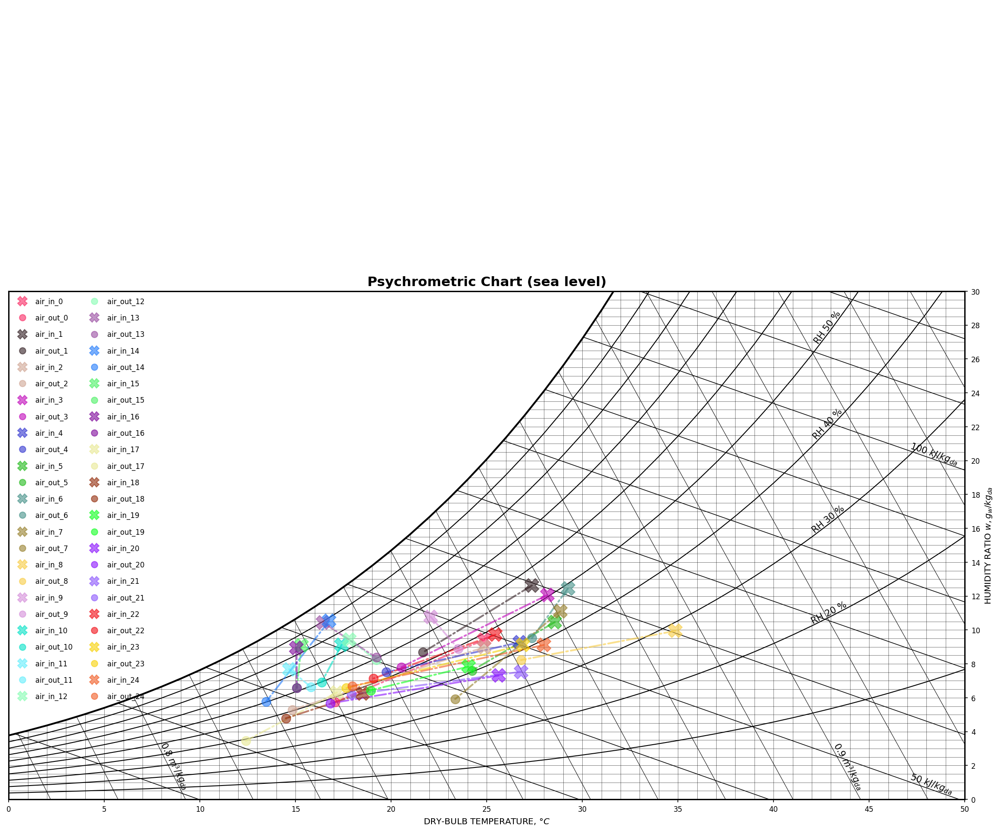

In [19]:
plot_psy_from_df_rotem(df_data=df_dempav_old)

## Joint

In [20]:
df_dempav_joint = pd.concat([df_dempav_new, df_dempav_old], axis = 0, ignore_index=True )

In [21]:
df_dempav_joint.head()

,T_a_in,RH_a_in,x_a_in,V_a_in,m_a_in,T_d_in,rho_d_in,xi_d_in,V_d_in,m_d_in,T_a_o_exp,RH_a_o_exp,x_a_o_exp,T_d_o_exp,rho_d_o_exp,xi_d_o_exp
0,295.299988,53.109997,0.008864,0.014062,0.016580,307.058580,1296.9,0.318301,4.75,0.102671,301.229980,55.309998,0.013235,NaN,NaN,NaN
1,295.299988,57.220001,0.009560,0.013327,0.015696,307.887747,1296.9,0.318301,4.75,0.102671,301.229980,54.975215,0.013153,NaN,NaN,NaN
2,297.619995,54.990002,0.010587,0.011852,0.013828,300.367375,1296.9,0.318451,4.75,0.102671,299.709991,52.950001,0.011560,NaN,NaN,NaN
3,295.619995,55.129997,0.009390,0.012824,0.015091,298.757935,1296.9,0.318318,4.75,0.102671,297.299988,52.639999,0.009932,NaN,NaN,NaN
4,295.805594,52.922000,0.009112,0.014517,0.017080,301.561459,1296.9,0.318328,4.75,0.102671,298.549988,48.299999,0.009818,NaN,NaN,NaN


In [22]:
df_dempav_joint.drop(columns=['V_a_in', 'rho_d_in', 'V_d_in', 'rho_d_o_exp', 'xi_d_o_exp',], inplace = True)
# df_dempav_joint.to_excel('dempav_2021_all.xlsx')

# data analysis

## compute effectiveness

In [23]:
df_dempav_joint['epsilon_T'] = np.vectorize(calc_epsilon_T)(df_dempav_joint.T_a_in,\
                                                           df_dempav_joint.T_a_o_exp,\
                                                           df_dempav_joint.T_d_in)

In [24]:
df_dempav_joint['epsilon_w'] = np.vectorize(calc_epsilon_w)(df_dempav_joint.x_a_in,\
                                                           df_dempav_joint.x_a_o_exp,\
                                                           df_dempav_joint.T_d_in,
                                                           df_dempav_joint.xi_d_in)

In [25]:
df_dempav_joint['epsilon_h'] = np.vectorize(calc_epsilon_h)(df_dempav_joint.T_a_in,\
                                                            df_dempav_joint.x_a_in,\
                                                            df_dempav_joint.T_a_o_exp,\
                                                           df_dempav_joint.x_a_o_exp,\
                                                           df_dempav_joint.T_d_in,
                                                           df_dempav_joint.xi_d_in)

In [26]:
df_dempav_joint['x_d_in_equ'] = np.vectorize(calc_x_des_equ)(df_dempav_joint.T_d_in,\
                                                            df_dempav_joint.xi_d_in)

In [27]:
df_dempav_joint['RH_d_in_equ'] = np.vectorize(get_RH)(df_dempav_joint.T_d_in,\
                                                     df_dempav_joint.x_d_in_equ) * 100

In [28]:
# df_dempav_joint.to_excel('dempav_2021_all.xlsx')
df_dempav_joint.shape

(142, 16)

## classifying

### cooling

In [29]:
df_dempav_cooling = df_dempav_joint.query('T_a_in - T_a_o_exp > 2 & epsilon_h < 0.95 & epsilon_h > 0.2')

In [30]:
df_dempav_cooling2 = df_dempav_joint.query('T_a_in - T_d_in > 2 & epsilon_h < 0.95 & epsilon_h > 0.2')

In [31]:
print(df_dempav_cooling.shape)
df_dempav_cooling2.shape

(17, 16)


(25, 16)

In [34]:
df_dempav_cooling2.index.difference(df_dempav_cooling.index)

Int64Index([45, 47, 49, 51, 53, 54, 123, 127], dtype='int64')

In [35]:
df_dempav_cooling3 = df_dempav_cooling2.loc[df_dempav_cooling2.index.difference(df_dempav_cooling.index),:]

### heating

In [36]:
df_dempav_heating = df_dempav_joint.query('T_a_o_exp - T_a_in > 2 & epsilon_h < 0.95 & epsilon_h > 0.1')

In [37]:
df_dempav_heating2 = df_dempav_joint.query('T_d_in - T_a_in > 2 & epsilon_h < 0.95 & epsilon_h > 0.1')

In [38]:
print(df_dempav_heating.shape)
df_dempav_heating2.shape

(18, 16)


(21, 16)

In [39]:
df_dempav_heating2.index.difference(df_dempav_heating.index)

Int64Index([11, 82, 92], dtype='int64')

df_dempav_heating3 = df_dempav_heating2.loc[df_dempav_heating2.index.difference(df_dempav_heating.index), :]

### others

In [40]:
df_dempav_other = df_dempav_joint.query('abs(T_a_o_exp - T_a_in) < 2')

In [41]:
df_dempav_other.shape

(105, 16)

In [42]:
df_epsilon_h_big = df_dempav_joint.query('epsilon_h > 0.95')
df_epsilon_h_big.shape

(7, 16)

In [43]:
df_epsilon_h_big.index.difference(df_dempav_other.index)

Int64Index([2, 130], dtype='int64')

In [44]:
df_dempav_other.index.difference(df_epsilon_h_big.index)

Int64Index([ 11,  23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,
             35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,
             48,  49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,
             61,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,
             74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,
             87,  88,  89,  90,  92,  93,  94,  95,  96,  97,  98,  99, 100,
            101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113,
            114, 115, 116, 123, 127, 128, 129, 132, 133],
           dtype='int64')

### export

In [87]:
path_expdata

'C:\\Users\\guang\\GIT\\EnBA_M\\BrineGrid_HDisNet\\Extras\\Python\\exp_data'

In [31]:
df_dempav_new.to_excel(os.path.join(path_expdata, 'data_2021', 'new_converted_2021.xlsx'))

In [89]:
df_dempav_cooling.to_excel(os.path.join(path_expdata, 'data_2021', 'cooling_2021.xlsx'))

In [90]:
df_dempav_heating.to_excel(os.path.join(path_expdata, 'data_2021', 'heating_2021.xlsx'))

In [104]:
if np.isnan(df_dempav_heating.loc[[0],:]['T_d_o_exp']).values[0]:
    print('True')

True


In [107]:
df_dempav_heating.loc[0,:]#['T_d_o_exp']

T_a_in         295.299988
RH_a_in         53.109997
x_a_in           0.008864
m_a_in           0.016580
T_d_in         307.058580
xi_d_in          0.318301
m_d_in           0.102671
T_a_o_exp      301.229980
RH_a_o_exp      55.309998
x_a_o_exp        0.013235
T_d_o_exp             NaN
epsilon_T        0.504311
epsilon_w        0.675941
epsilon_h        0.602052
x_d_in_equ       0.015330
RH_d_in_equ     45.801315
Name: 0, dtype: float64

## plotting

### cooling

[0.49019274 0.62121032 0.02431196 0.6       ]
[0.82754591 0.73713019 0.084199   0.6       ]
[0.77078642 0.0210672  0.1423789  0.6       ]
[0.55411684 0.351463   0.07302436 0.6       ]
[0.01426341 0.12297566 0.6578768  0.6       ]
[0.64619348 0.72306443 0.37088455 0.6       ]
[0.30180509 0.57505324 0.59030365 0.6       ]
[0.19640768 0.06336684 0.91922872 0.6       ]
[0.62986786 0.16128018 0.89272592 0.6       ]
[0.8849333  0.91436758 0.65693875 0.6       ]
[0.81138044 0.42699419 0.87119922 0.6       ]
[0.92848898 0.14701575 0.923244   0.6       ]
[0.28364273 0.84695461 0.77246144 0.6       ]
[0.08564543 0.32843198 0.24067638 0.6       ]
[0.65758251 0.31978564 0.39680636 0.6       ]
[0.51414735 0.94227472 0.07968333 0.6       ]


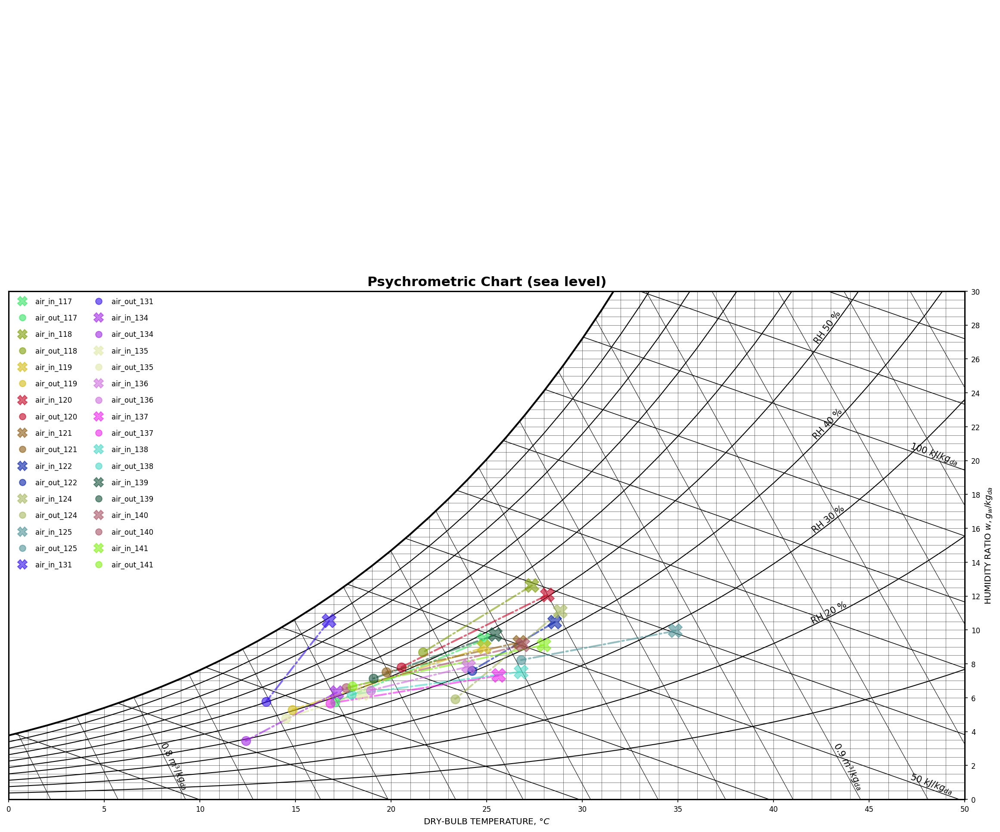

In [45]:
plot_psy_from_df_rotem(df_data=df_dempav_cooling)

[0.17551694 0.58266513 0.20457575 0.6       ]
[0.01768822 0.23557783 0.70468778 0.6       ]
[0.21164598 0.58441751 0.76511009 0.6       ]
[0.46922293 0.05025471 0.62635963 0.6       ]
[0.06268903 0.31730102 0.32952128 0.6       ]
[0.11929424 0.81008996 0.6320169  0.6       ]
[0.68486728 0.18563444 0.49055278 0.6       ]
[0.35122248 0.20776875 0.63550165 0.6       ]
[0.21947216 0.81522252 0.28754716 0.6       ]
[0.08267139 0.19029518 0.59405741 0.6       ]
[0.84159266 0.64327356 0.81395665 0.6       ]
[0.57449759 0.53492879 0.32653774 0.6       ]
[0.11600737 0.19996128 0.3846752  0.6       ]
[0.50123473 0.31500513 0.19477871 0.6       ]
[0.45484422 0.34615528 0.77500747 0.6       ]
[0.80710756 0.08334005 0.41871137 0.6       ]
[0.64248454 0.64251796 0.90981757 0.6       ]
[0.31002594 0.10323724 0.84022918 0.6       ]
[0.36641582 0.95204933 0.11561964 0.6       ]
[0.74520039 0.16997292 0.83308966 0.6       ]
[0.60626149 0.24883558 0.93553825 0.6       ]
[0.88372017 0.49790321 0.24119346 

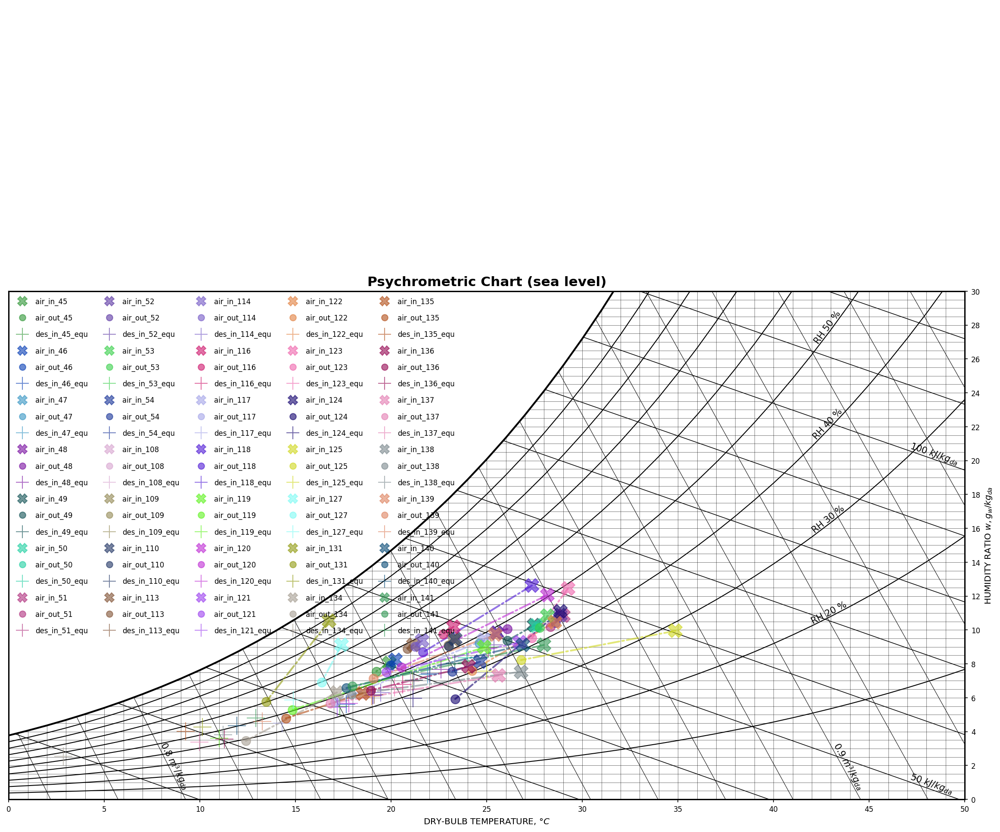

In [72]:
plot_with_des_point_df(df_data=df_dempav_cooling2, chart_template='ashrae', use_line_highlight = False, ncol = 5)

[0.17367651 0.32444396 0.60292319 0.6       ]
[0.704864   0.62980718 0.53542607 0.6       ]
[0.76085325 0.89597441 0.33542479 0.6       ]
[0.46552875 0.90992318 0.94141443 0.6       ]
[0.1326034  0.90637615 0.91801359 0.6       ]
[0.07603913 0.51277183 0.54475737 0.6       ]
[0.34989488 0.32758561 0.40151863 0.6       ]
[0.03857796 0.56016539 0.93729846 0.6       ]
[0.0756344  0.11117072 0.76858021 0.6       ]
[0.51686467 0.51313397 0.5777213  0.6       ]
[0.22685241 0.89307611 0.99545627 0.6       ]
[0.51374835 0.31564914 0.2539087  0.6       ]
[0.50018903 0.41172922 0.21502511 0.6       ]
[0.74590503 0.18063532 0.69415736 0.6       ]
[0.63328257 0.52761412 0.37585414 0.6       ]
[0.93197242 0.13047811 0.53485699 0.6       ]
[0.7830806  0.01632587 0.91334382 0.6       ]
[0.01315642 0.80841179 0.29940068 0.6       ]


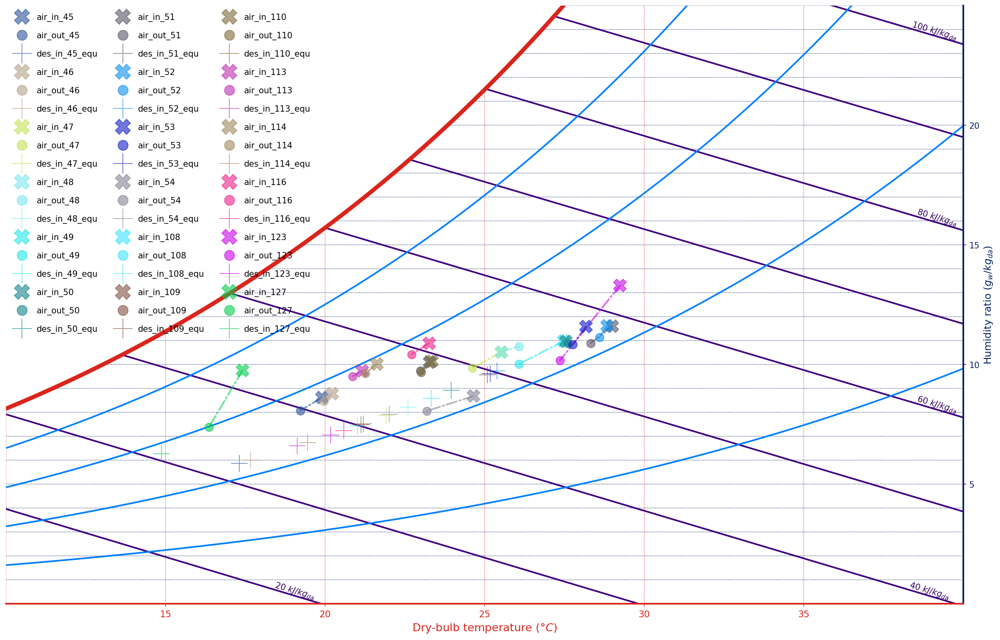

In [79]:
plot_with_des_point_df(df_data=df_dempav_cooling3, chart_template='minimal', use_line_highlight = False)

[0.75085818 0.16162097 0.28117237 0.6       ]
[0.4983125  0.54690117 0.96114768 0.6       ]
[0.95994792 0.41691688 0.08954407 0.6       ]
[0.93549347 0.9905572  0.69155942 0.6       ]
[0.01333009 0.15650318 0.54895425 0.6       ]
[0.78501989 0.16346824 0.19614407 0.6       ]
[0.92559473 0.39862762 0.39400969 0.6       ]
[0.96470181 0.67619961 0.60358288 0.6       ]
[0.60114755 0.18053099 0.09165465 0.6       ]
[0.05475641 0.12698325 0.73081367 0.6       ]
[0.62873772 0.64702567 0.04564807 0.6       ]
[0.07949548 0.04848916 0.49074644 0.6       ]
[0.83839822 0.32545584 0.94314196 0.6       ]
[0.48011037 0.19217712 0.15378522 0.6       ]
[0.27139197 0.11675229 0.43773996 0.6       ]
[0.77442394 0.13640108 0.17687614 0.6       ]
[0.036288   0.94386447 0.34968833 0.6       ]
[0.14659353 0.86729073 0.31256251 0.6       ]
[0.54016435 0.98429929 0.87613895 0.6       ]
[0.83812271 0.92148575 0.19947822 0.6       ]
[0.5297633  0.99270665 0.06766807 0.6       ]
[0.46796702 0.50804779 0.2255373  

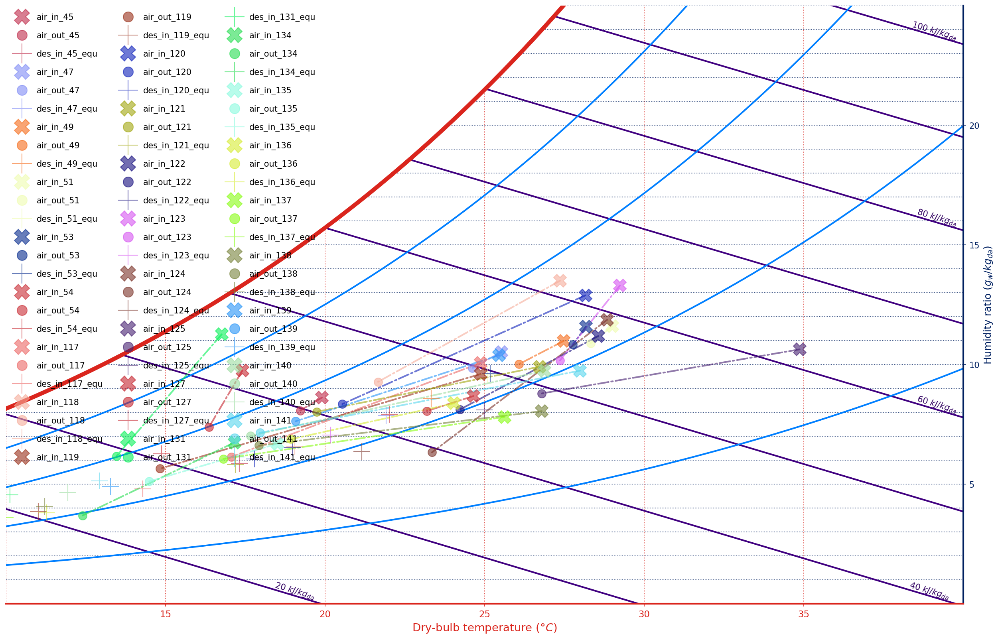

In [47]:
plot_with_des_point_df(df_data=df_dempav_cooling2, chart_template='minimal', save_fig_name="cooling_normal.png")

In [109]:
df_dempav_cooling2.loc[[33,30, 29],:]

,T_a_in,RH_a_in,x_a_in,m_a_in,T_d_in,xi_d_in,m_d_in,T_a_o_exp,RH_a_o_exp,x_a_o_exp,T_d_o_exp,epsilon_T,epsilon_w,epsilon_h,x_d_in_equ,RH_d_in_equ
33,290.56,73.96,0.009162,0.046145,288.03,0.276610,0.104692,289.51,60.06,0.006936,286.984,0.415020,0.681545,0.618465,0.005896,55.986678
30,301.99,44.94,0.011151,0.018140,294.30,0.343938,0.104834,296.50,33.44,0.005948,293.038,0.713914,1.007624,0.898218,0.005988,38.315854
29,302.39,49.11,0.012498,0.050221,293.32,0.318283,0.102676,300.51,42.09,0.009558,291.612,0.207277,0.500668,0.389235,0.006625,44.990209


[0.58225307 0.2378319  0.57915472 0.6       ]
[0.83532291 0.69300829 0.14817608 0.6       ]
[0.32638072 0.5924165  0.97609606 0.6       ]


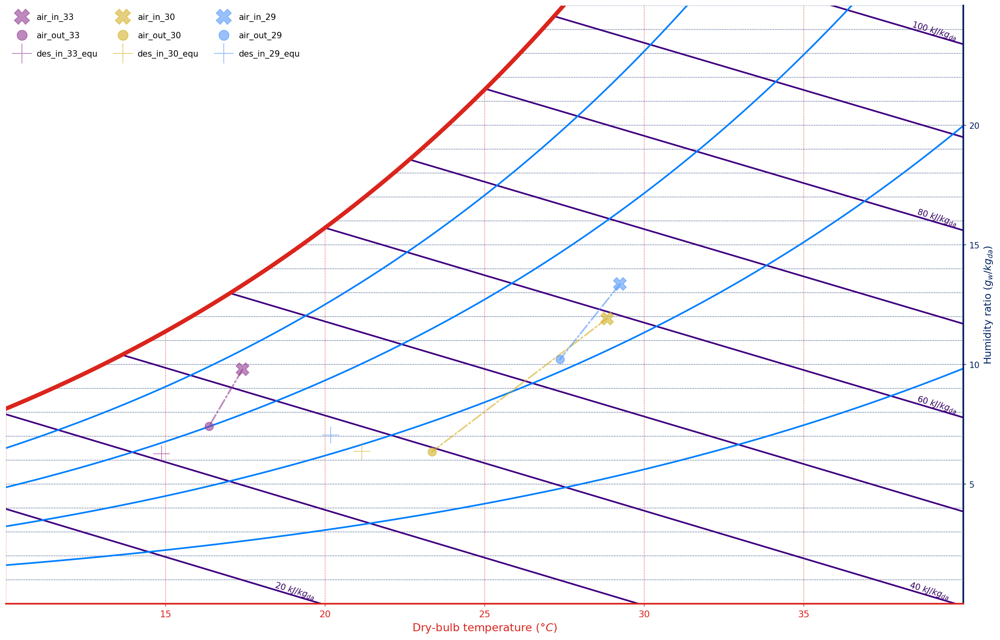

In [108]:
plot_with_des_point_df(df_data=df_dempav_cooling2.loc[[33,30,29],:], chart_template='minimal')

### heating

In [89]:
df_dempav_heating3.index

Int64Index([ 11,  23,  24,  25,  26,  27,  28,  29,  30,  55,  56,  57,  58,
             59,  60,  61,  62,  64,  65,  66,  67,  68,  69,  70,  71,  72,
             73,  74,  75,  76,  77,  78,  79,  82,  83,  84,  85,  86,  87,
             88,  89,  90,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101,
            102],
           dtype='int64')

[0.13778282 0.32436151 0.70202108 0.6       ]
[0.51484368 0.91868066 0.58264828 0.6       ]
[0.8807723  0.98814944 0.73748048 0.6       ]
[0.40417746 0.14670512 0.44424393 0.6       ]
[0.0095255  0.69195381 0.25958092 0.6       ]
[0.06064952 0.46122886 0.36074588 0.6       ]
[0.96183103 0.99981512 0.38042372 0.6       ]
[0.27233647 0.190877   0.18982368 0.6       ]
[0.74325287 0.65785191 0.43921754 0.6       ]
[0.90029448 0.13850838 0.0295646  0.6       ]
[0.38763822 0.29440755 0.93032971 0.6       ]
[0.88506563 0.6119696  0.76339317 0.6       ]
[0.38987121 0.1992215  0.29680468 0.6       ]
[0.40386256 0.8565352  0.6643401  0.6       ]
[0.2977907  0.29822815 0.20104977 0.6       ]
[0.70126677 0.49119216 0.04309354 0.6       ]
[0.01219276 0.3193488  0.04340756 0.6       ]
[0.20037685 0.38776215 0.85102761 0.6       ]
[0.44881076 0.54204337 0.2958986  0.6       ]
[0.40854874 0.07280609 0.17065558 0.6       ]
[0.17021902 0.32526482 0.08741488 0.6       ]
[0.04251596 0.6017654  0.00182067 

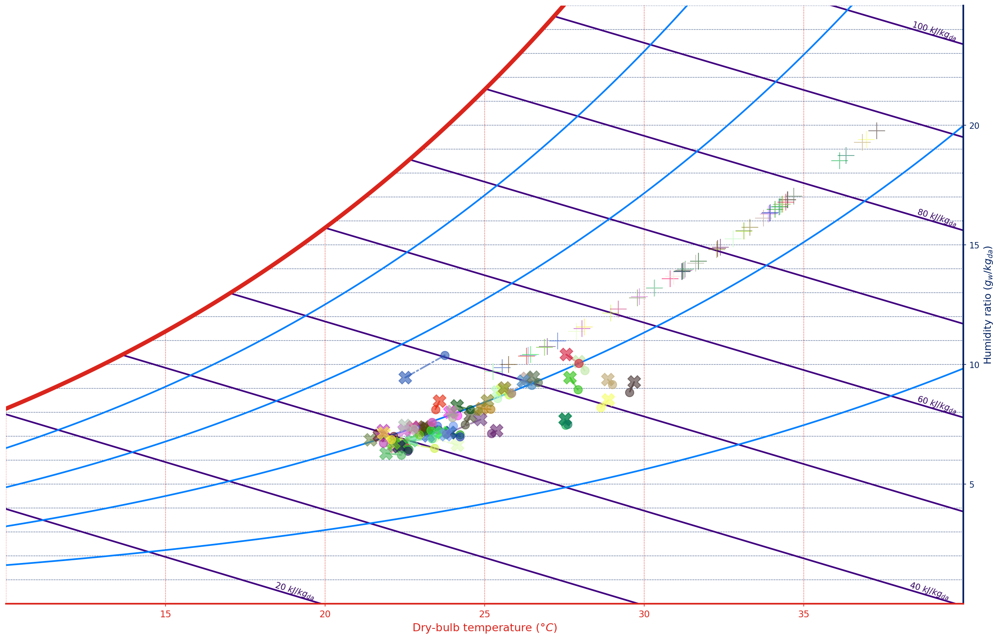

In [86]:
plot_with_des_point_df(df_data=df_dempav_heating3, chart_template='minimal', ncol=5, if_legend=False)

[0.25585596 0.08476347 0.50790731 0.6       ]
[0.74570804 0.94704018 0.08126698 0.6       ]
[0.38884101 0.81774042 0.38038281 0.6       ]
[0.76327516 0.18718122 0.54957918 0.6       ]
[0.69956984 0.52139089 0.602178   0.6       ]
[0.19619645 0.84583138 0.88526097 0.6       ]
[0.7632981  0.80784111 0.66035106 0.6       ]
[0.57213594 0.23780308 0.14000229 0.6       ]
[0.92312423 0.38574235 0.44475228 0.6       ]
[0.82866406 0.36903091 0.35697267 0.6       ]
[0.84587949 0.90102955 0.19688717 0.6       ]
[0.11590139 0.65088415 0.30065819 0.6       ]
[0.52528507 0.87210984 0.4613339  0.6       ]
[0.38833566 0.64950564 0.28009724 0.6       ]
[0.8109454  0.7666348  0.75347526 0.6       ]
[0.5458094  0.47401713 0.22142078 0.6       ]
[0.25393838 0.79333791 0.02225396 0.6       ]
[0.58083432 0.80307635 0.4865433  0.6       ]


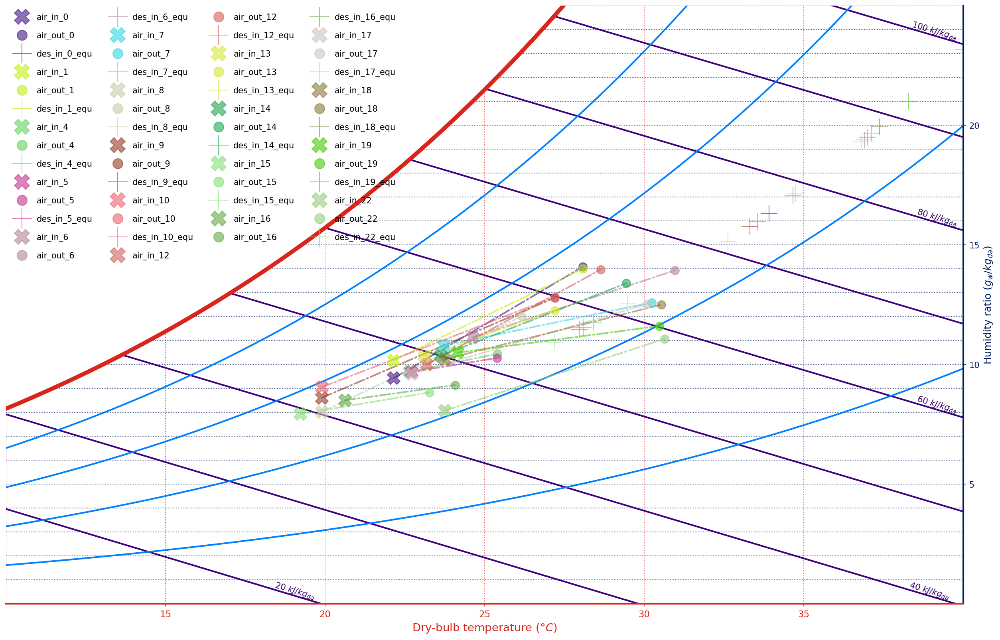

<Figure size 432x288 with 0 Axes>

In [50]:
plot_with_des_point_df(df_data=df_dempav_heating, chart_template='minimal', ncol=4, save_fig_name="Heating_normal.png")

[0.26022462 0.03053421 0.37842292 0.6       ]
[0.27488459 0.57785733 0.6634757  0.6       ]
[0.77785222 0.98343112 0.71448404 0.6       ]
[0.3261475  0.44305893 0.66241989 0.6       ]
[0.0918894  0.66419515 0.6055209  0.6       ]
[0.64504413 0.75083234 0.09208788 0.6       ]
[0.69126932 0.60850333 0.62821377 0.6       ]
[0.53824375 0.19010565 0.53724357 0.6       ]
[0.92891951 0.75347562 0.15492931 0.6       ]
[0.78962011 0.9285766  0.94401695 0.6       ]
[0.30089247 0.36679414 0.30718862 0.6       ]
[0.83339384 0.70929142 0.42041744 0.6       ]
[0.09058315 0.14943684 0.48641458 0.6       ]
[0.23150673 0.72767449 0.24303986 0.6       ]
[0.66529998 0.81290044 0.32671315 0.6       ]
[0.83317444 0.22101595 0.11983793 0.6       ]
[0.82256336 0.52841308 0.44278629 0.6       ]
[3.85488657e-04 8.60256967e-01 8.50995467e-01 6.00000000e-01]
[0.10695686 0.03711421 0.39591607 0.6       ]
[0.95537214 0.58797446 0.64169279 0.6       ]
[0.43212216 0.11089915 0.42895916 0.6       ]
[0.29928816 0.3491

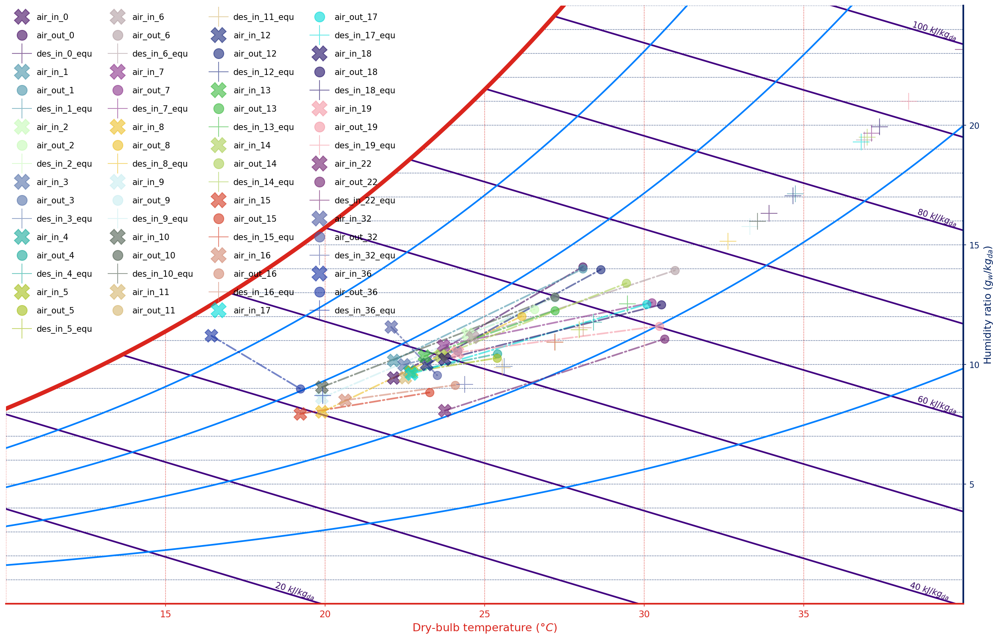

In [71]:
plot_with_des_point_df(df_data=df_dempav_heating2, chart_template='minimal', ncol=4)

In [83]:
df_dempav_heating2.loc[[11],:]

,T_a_in,RH_a_in,x_a_in,m_a_in,T_d_in,xi_d_in,m_d_in,T_a_o_exp,RH_a_o_exp,x_a_o_exp,T_d_o_exp,epsilon_T,epsilon_w,epsilon_h,x_d_in_equ,RH_d_in_equ
11,295.660004,52.080002,0.008885,0.016724,298.694936,0.31832,0.102671,296.899994,52.990002,0.009758,NaN,0.408573,2.21065,0.848736,0.00928,45.299393


[0.25744796 0.14910072 0.43980644 0.6       ]


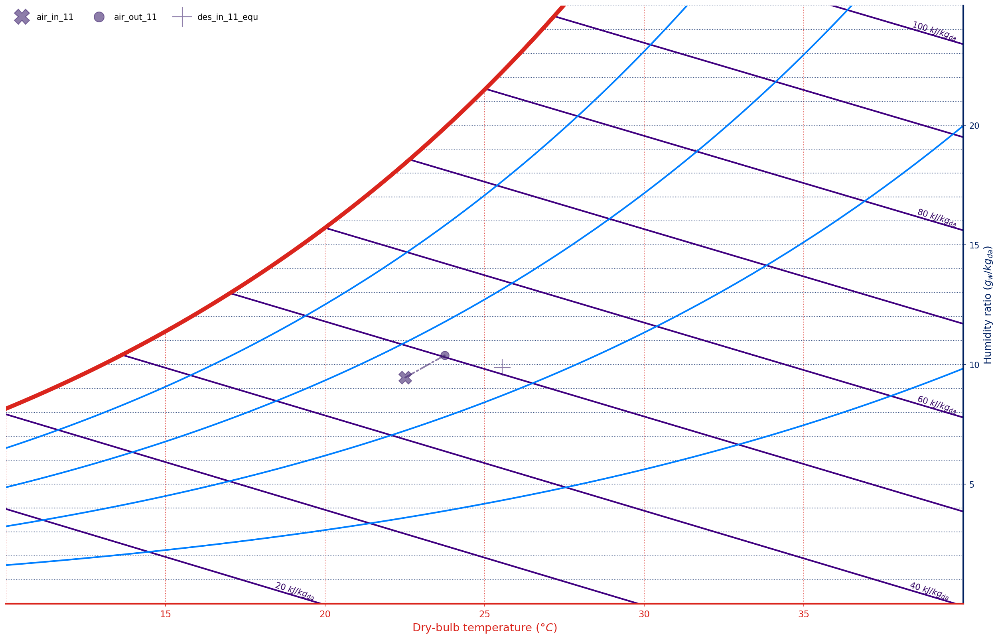

In [84]:
plot_with_des_point_df(df_data=df_dempav_heating2.loc[[11],:], chart_template='minimal')

### others

In [39]:
df_dempav_other

,T_a_in,RH_a_in,x_a_in,m_a_in,T_d_in,xi_d_in,m_d_in,T_a_o_exp,RH_a_o_exp,x_a_o_exp,T_d_o_exp,epsilon_T,epsilon_w,epsilon_h,x_d_in_equ,RH_d_in_equ
3,295.619995,55.129997,0.009390,0.015091,298.757935,0.318318,0.102671,297.299988,52.639999,0.009932,NaN,0.535381,-7.333205,1.024653,0.009316,45.303721
11,295.660004,52.080002,0.008885,0.016724,298.694936,0.318320,0.102671,296.899994,52.990002,0.009758,NaN,0.408573,2.210650,0.848736,0.009280,45.299393
20,292.369995,41.960003,0.005818,0.021054,291.435429,0.318207,0.000000,292.369995,38.920002,0.005392,NaN,0.000000,-7.817338,1.326332,0.005872,44.898422
21,293.209991,41.960003,0.006132,0.020420,291.282049,0.318223,0.000000,292.369995,38.920002,0.005392,NaN,0.435696,2.319778,0.985857,0.005813,44.885164
29,302.390000,49.110000,0.012498,0.050221,293.320000,0.318283,0.102676,300.510000,42.090000,0.009558,291.612,0.207277,0.500668,0.389235,0.006625,44.990209
32,295.220000,65.240000,0.010821,0.037419,297.520000,0.318444,0.102671,296.660000,49.510000,0.008935,297.085,0.626087,0.858124,1.026632,0.008623,45.196585
33,290.560000,73.960000,0.009162,0.046145,288.030000,0.276610,0.104692,289.510000,60.060000,0.006936,286.984,0.415020,0.681545,0.618465,0.005896,55.986678
34,287.820000,74.370000,0.007716,0.046695,288.080000,0.276609,0.104692,288.950000,59.860000,0.006667,287.850,4.346154,0.582424,0.349726,0.005915,55.989743
35,290.960000,74.380000,0.009454,0.017667,291.220000,0.276636,0.104692,292.370000,59.740000,0.008279,291.133,5.423077,0.536047,0.290339,0.007262,56.162768
38,288.460000,84.330000,0.009138,0.044734,286.750000,0.276611,0.104690,288.220000,62.120000,0.006602,285.747,0.140351,0.681335,0.597036,0.005415,55.912728


[0.99913309 0.05789151 0.80047132 0.6       ]
[0.31692463 0.02776474 0.47200887 0.6       ]
[0.47294484 0.44909013 0.7022276  0.6       ]
[0.89806498 0.37903584 0.16310196 0.6       ]
[0.65875731 0.03025761 0.63047671 0.6       ]
[0.82712725 0.85221254 0.79465822 0.6       ]
[0.78117541 0.57750912 0.85590558 0.6       ]
[0.17924222 0.53062958 0.25026791 0.6       ]
[0.08132236 0.23391172 0.01000346 0.6       ]
[0.54701592 0.70073815 0.38021174 0.6       ]


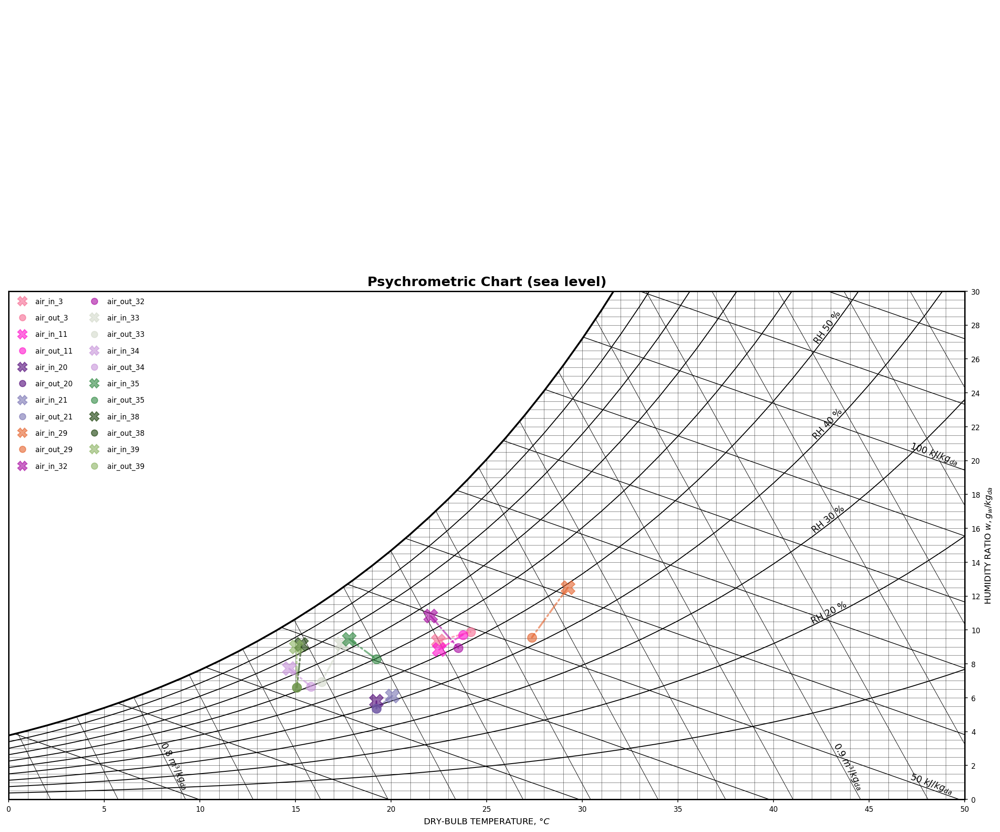

In [40]:
plot_psy_from_df_rotem(df_data=df_dempav_other)

[0.10748703 0.01591628 0.5716266  0.6       ]
[0.99556547 0.74216489 0.80570067 0.6       ]
[0.35381841 0.42690602 0.32109902 0.6       ]
[0.76783435 0.56738904 0.49151672 0.6       ]
[0.63363944 0.1044972  0.40611176 0.6       ]
[0.11422326 0.32879246 0.72094806 0.6       ]
[0.45691807 0.45720135 0.29213825 0.6       ]
[0.92904224 0.02391867 0.24153359 0.6       ]
[0.04335123 0.07224892 0.95459783 0.6       ]
[0.04670993 0.57400783 0.72164816 0.6       ]
[0.05186989 0.72737455 0.24672041 0.6       ]


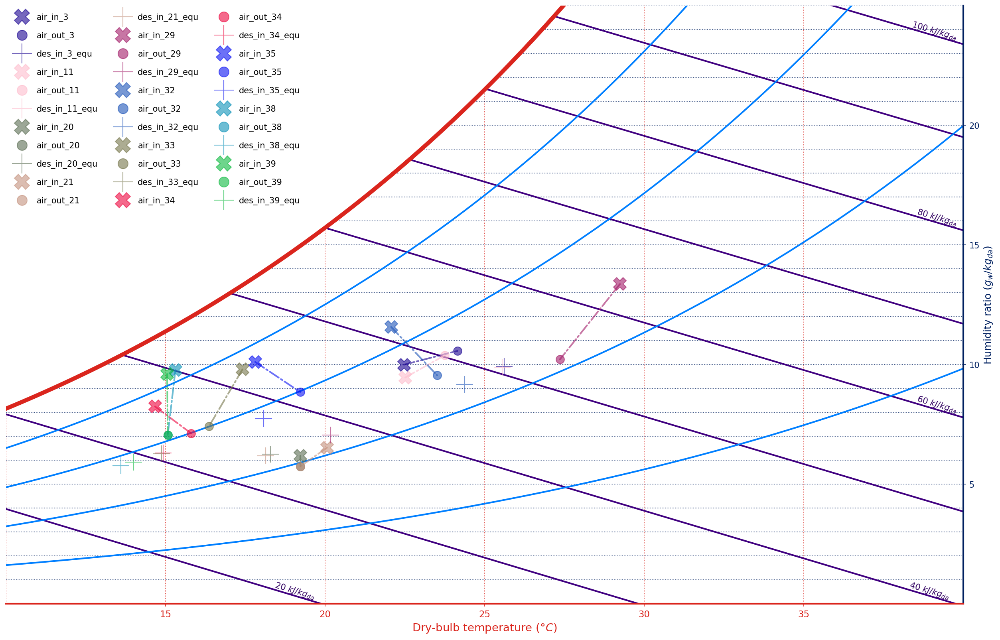

In [41]:
plot_with_des_point_df(df_data=df_dempav_other, chart_template='minimal', ncol=3)

### abnormal h_efficiency

[0.26051823 0.70381384 0.28912734 0.6       ]
[0.94414469 0.78911135 0.45169913 0.6       ]
[0.05412686 0.49013212 0.43939203 0.6       ]
[0.5619963  0.04931505 0.84781514 0.6       ]
[0.85263616 0.22945656 0.0526124  0.6       ]
[0.69303399 0.6504312  0.76448149 0.6       ]
[0.81751836 0.86806425 0.02116422 0.6       ]


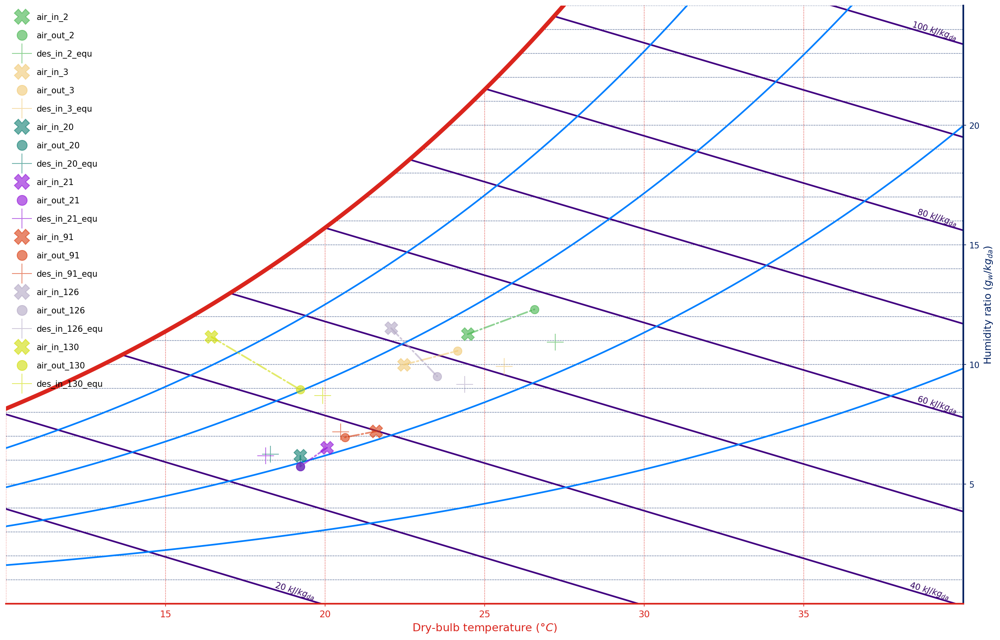

<Figure size 432x288 with 0 Axes>

In [52]:
plot_with_des_point_df(df_data=df_epsilon_h_big, chart_template='minimal', ncol=1, save_fig_name="abnormal.png")

In [46]:
load_config('minimal')

{'figure': {'figsize': [16, 10],
  'base_fontsize': 10,
  'title': None,
  'x_label': 'Dry-bulb temperature ($°C$)',
  'y_label': 'Humidity ratio ($g_w / kg_{da}$)',
  'x_axis': {'color': [0.855, 0.145, 0.114], 'linewidth': 2, 'linestyle': '-'},
  'x_axis_labels': {'color': [0.855, 0.145, 0.114], 'fontsize': 11},
  'y_axis': {'color': [0.0, 0.125, 0.376], 'linewidth': 2, 'linestyle': '-'},
  'y_axis_labels': {'color': [0.0, 0.125, 0.376], 'fontsize': 10},
  'x_axis_ticks': {'direction': 'out', 'color': [0.855, 0.145, 0.114]},
  'y_axis_ticks': {'direction': 'out', 'color': [0.0, 0.125, 0.376]},
  'partial_axis': True,
  'position': [0, 0, 1, 1]},
 'limits': {'range_temp_c': [10, 40],
  'range_humidity_g_kg': [0, 25],
  'altitude_m': 550,
  'pressure_kpa': None,
  'step_temp': 0.25},
 'saturation': {'color': [0.855, 0.145, 0.114],
  'linewidth': 5,
  'linestyle': '-'},
 'constant_rh': {'color': [0.0, 0.498, 1.0], 'linewidth': 2, 'linestyle': '-'},
 'constant_v': {'color': [0.0, 0.502, 0